### Make install


In [ ]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

In [ ]:
!pip install -qqq roboflow supervision umap-learn

In [1]:
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

!mkdir images
!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg
    
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

/bin/bash: {sys.executable}: command not found
/bin/bash: {sys.executable}: command not found
--2023-05-21 07:50:13--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 271475 (265K) [image/jpeg]
Saving to: ‘images/truck.jpg’

truck.jpg           100%[===================>] 265.11K  --.-KB/s    in 0.03s   

2023-05-21 07:50:13 (8.24 MB/s) - ‘images/truck.jpg’ saved [271475/271475]

--2023-05-21 07:50:13--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent

In [2]:
sam_checkpoint = "../sam_vit_h_4b8939.pth"
device = "cuda"
model_type = "default"

In [3]:
!git clone https://github.com/facebookresearch/segment-anything.git

Cloning into 'segment-anything'...
remote: Enumerating objects: 284, done.
remote: Counting objects: 100% (204/204), done.
remote: Compressing objects: 100% (85/85), done.
remote: Total 284 (delta 132), reused 119 (delta 119), pack-reused 80
Receiving objects: 100% (284/284), 18.31 MiB | 21.26 MiB/s, done.
Resolving deltas: 100% (142/142), done.


In [4]:
%cd /content/segment-anything

/content/segment-anything


In [5]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

In [6]:
%%capture
!pip install ftfy regex tqdm matplotlib selectivesearch
!pip install git+https://github.com/openai/CLIP.git


In [7]:
import cv2
from segment_anything import build_sam, SamAutomaticMaskGenerator
from PIL import Image, ImageDraw
import clip
import torch
import numpy as np

In [8]:

# Download the model weights to load them here
mask_generator = SamAutomaticMaskGenerator(build_sam(checkpoint="/content/sam_vit_h_4b8939.pth"))

In [10]:
def convert_box_xywh_to_xyxy(box):
    x1 = box[0]
    y1 = box[1]
    x2 = box[0] + box[2]
    y2 = box[1] + box[3]
    return [x1, y1, x2, y2]

In [11]:
def segment_image(image, segmentation_mask,path_save,mask_c):
    image_array = np.array(image)
    segmented_image_array = np.zeros_like(image_array)
    segmented_image_array[segmentation_mask] = image_array[segmentation_mask]
    segmented_image = Image.fromarray(segmented_image_array)
    black_image = Image.new("RGB", image.size, (0, 0, 0))
    transparency_mask = np.zeros_like(segmentation_mask, dtype=np.uint8)
    transparency_mask[segmentation_mask] = 255
    transparency_mask_image = Image.fromarray(transparency_mask, mode='L')
    black_image.paste(segmented_image, mask=transparency_mask_image)
    black_image.save(f"{path_save}/{mask_c}.jpg")
    return black_image

### Selecting the source image mask


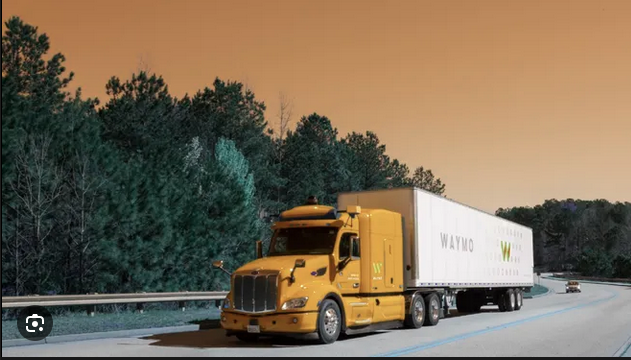

In [197]:
from google.colab.patches import cv2_imshow



#source image path
search_path = "/content/truck.png"



search = [Image.open(search_path)]
cv2_imshow(np.array(search[0]))

In [29]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  

In [ ]:
!pip install ipympl
from google.colab import output
output.enable_custom_widget_manager()

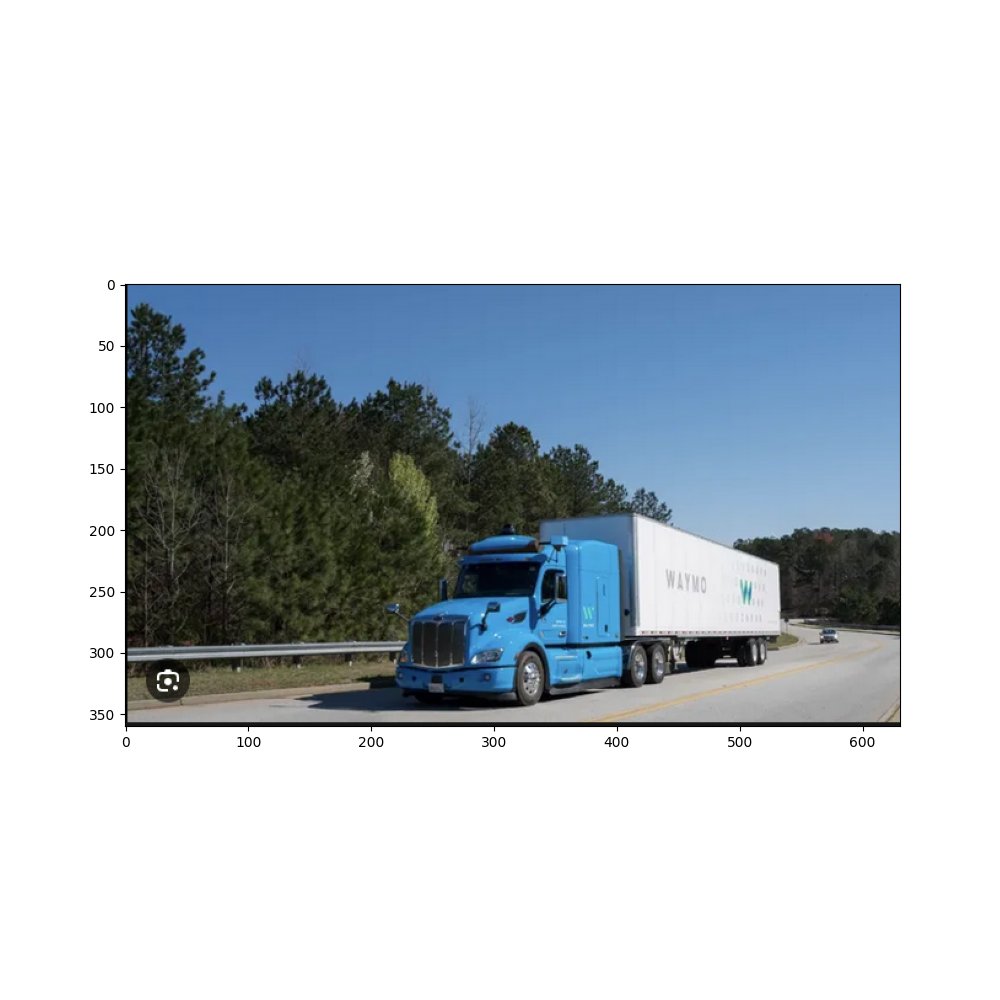

Output()

In [47]:
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon
from ipywidgets import Output
from PIL import Image

%matplotlib ipympl

search_path = "/content/truck.png"
image = Image.open(search_path)

fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

output = Output()
display(output)
global input_point;

def onclick(event):
    if event.inaxes is not None:
        x, y = event.xdata, event.ydata
        with output:
            output.clear_output(wait=True)
            print("Clicked at x = {}, y = {}".format(x, y))
            input_point = np.array([[x, y]])
            poly = RegularPolygon(
                xy=(x, y),
                numVertices=5,
                radius=10,
                orientation=np.pi / 2,
                facecolor='none',
                edgecolor='r',
                linewidth=2
            )
            ax.add_patch(poly)
            fig.canvas.draw_idle()

cid = fig.canvas.mpl_connect('button_press_event', onclick)


In [51]:
search_path = "/content/truck.png"
search_image = cv2.imread(search_path)
predictor.set_image(search_image)

In [42]:
input_label = np.array([1])

In [53]:
input_label

array([1])

In [62]:
input_point = np.array([[373,263]])

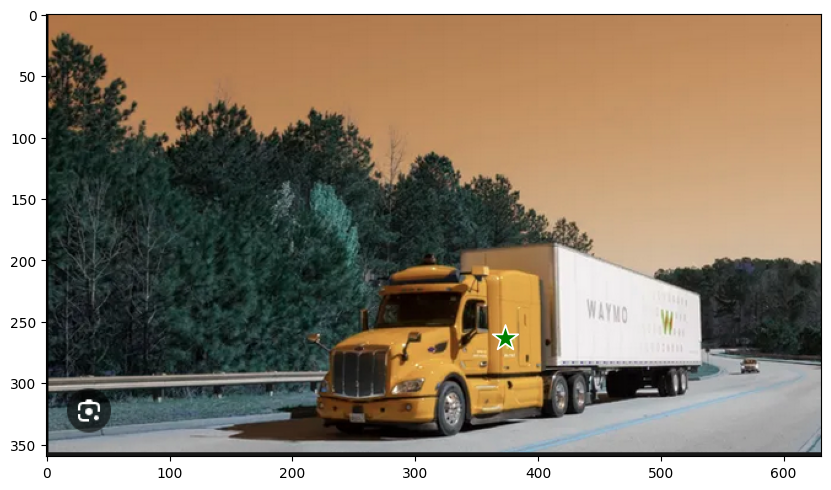

In [63]:
%matplotlib inline


plt.figure(figsize=(10,10))
plt.imshow(search_image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [73]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

In [ ]:
masks.shape

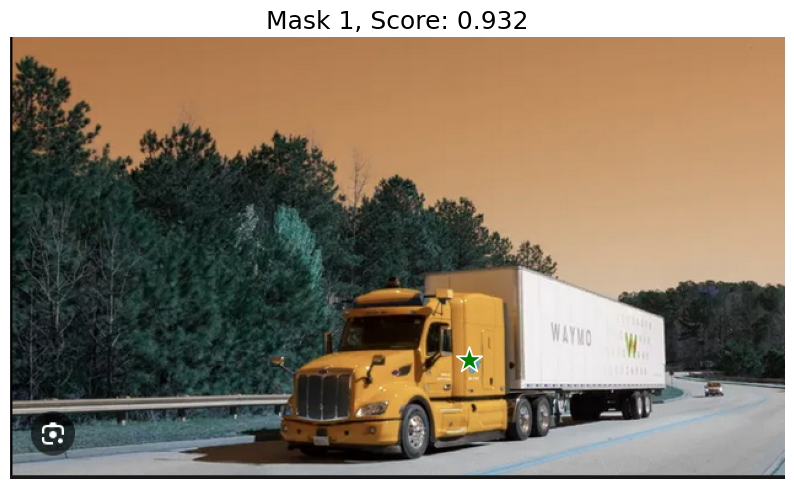

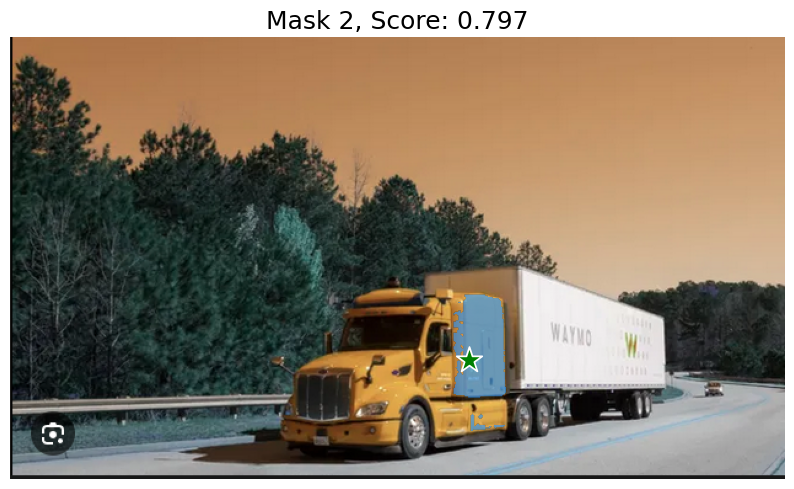

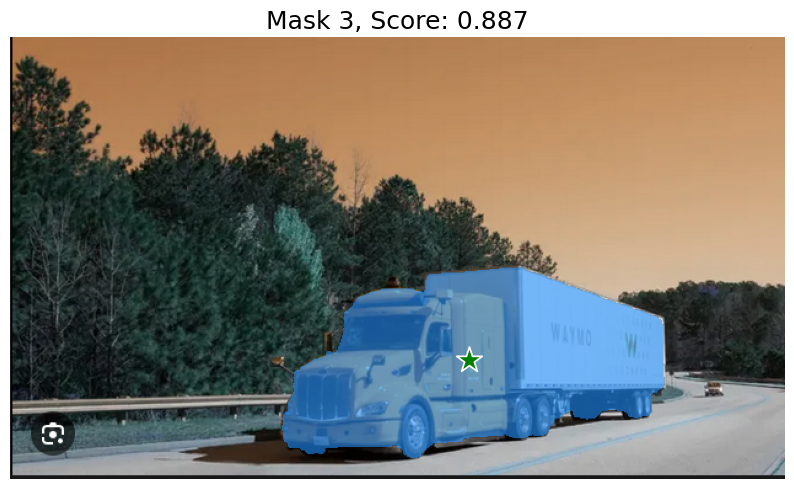

 Select which masks works good for you 3


In [76]:
%matplotlib inline

for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(search_image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  
mask_num = input(" Select which masks works good for you looking at the mask number on top ")
mask  = masks[int(mask_num)-1]

In [81]:
search_image.shape

(360, 631, 3)

In [82]:
mask.shape

(360, 631)

In [87]:
import numpy as np
import cv2

image = search_image.copy()
result = np.zeros_like(image)

# Create binary mask where masked region is white (255) and the rest is black (0)
binary_mask = np.where(mask > 0, 255, 0).astype(np.uint8)

# Combine the black image and the desired image using the binary mask
result[np.where(binary_mask == 255)] = image[np.where(binary_mask == 255)]
cv2.imwrite("/content/result.png",result)

### Few shots images and masking using SAM




In [198]:
# Cut out all masks
import glob
import os 



folder_path = "/content/images"





os.makedirs("/content/extract",exist_ok = True)
cropped_boxes = []
masks_list = []
cropped_path = []
labels = []
for image_path in glob.glob(f"{folder_path}/*"):
    print("Image Path ",image_path)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    masks = mask_generator.generate(image)
    image = Image.open(image_path)
    subfolder = os.path.basename(image_path).split(".")[0]
    
    # print("Sub folder path ",subfolder)
    os.makedirs(f"/content/extract/{subfolder}",exist_ok = True)
    for c,mask in enumerate(masks):
        labels.append(1)
        cropped_path.append(f"/content/extract/{subfolder}/{c}.jpg")
        masks_list.append(mask)
        cropped_boxes.append(segment_image(image, mask["segmentation"],f"/content/extract/{subfolder}",c).crop(convert_box_xywh_to_xyxy(mask["bbox"])))

Image Path  /content/images/trucksec.jpg
Image Path  /content/images/truck.jpg


2


214

In [203]:
import itertools
print(len(masks_list))# len(masks)

sample_image = [Image.open("/content/result.png")]

179


In [204]:
# Load CLIP


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model, preprocess = clip.load("ViT-B/32", device=device)

In [205]:
@torch.no_grad()
def retrieve(elements: list[Image.Image], search_image: list[Image.Image]) -> int:
    preprocessed_images = [preprocess(image).to(device) for image in elements]

    stacked_images = torch.stack(preprocessed_images)
    image_features_init = model.encode_image(stacked_images)
    preprocessed_images = [preprocess(image).to(device) for image in sample_image]

    stacked_images = torch.stack(preprocessed_images)   
    search_features_init = model.encode_image(stacked_images)
    print(image_features_init.shape,search_features_init.shape)

    image_features = image_features_init / image_features_init.norm(dim=-1, keepdim=True) 
    search_features = search_features_init / search_features_init.norm(dim=-1, keepdim=True)
    probs = 100. * image_features @ search_features.T
    return probs[:, 0].softmax(dim=0),image_features_init,search_features_init

def get_indices_of_values_above_threshold(values, threshold):
    return [i for i, v in enumerate(values) if v > threshold]

torch.Size([179, 512]) torch.Size([1, 512])
len of scores  179
[2, 135]
Cropped paths of masks images  /content/extract/trucksec/2.jpg
Cropped paths of masks images  /content/extract/truck/33.jpg
image path to open  /content/images/trucksec.jpg


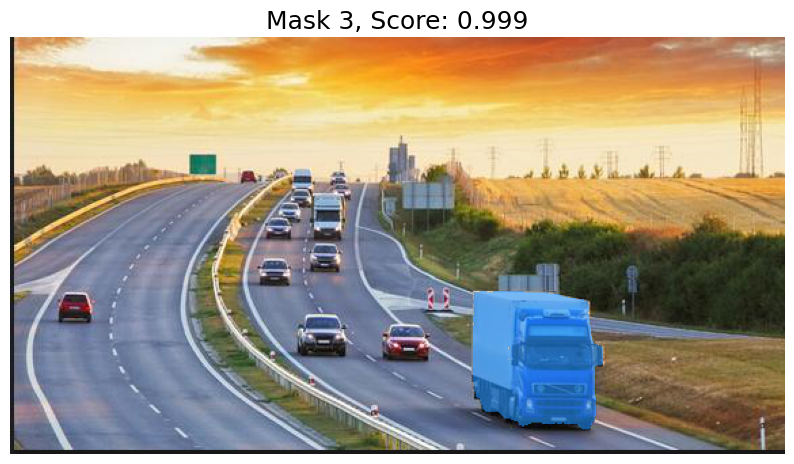

image path to open  /content/images/truck.jpg


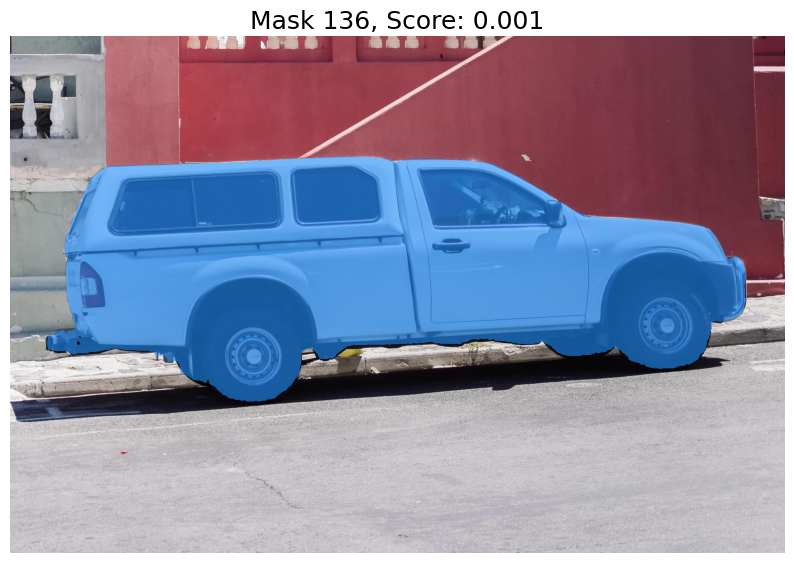

In [221]:
%matplotlib inline


Confidence_scores  = 0.2
Topk = 2





scores,imgf,searchf = retrieve(cropped_boxes, search)
print("len of scores ", len(scores))
# print(scores)
topk = torch.topk(scores,Topk).indices
indices = topk.tolist()
print(indices)

for i in range(0,len(indices)):
    print("Cropped paths of masks images ",cropped_path[indices[i]])

ci = 0
for i, (mask, score,cpath) in enumerate(zip(masks_list, scores,cropped_path)):
    if i in indices:
        plt.figure(figsize=(10,10))
        
        st = os.path.dirname(cpath)
        st = st.rsplit("/")[-1] + ".jpg"
        print("image path to open ",f"{folder_path}/{st}")
        ci = ci +1
        vis_image = Image.open(f"{folder_path}/{st}")
        plt.imshow(vis_image)
        show_mask(mask["segmentation"], plt.gca())
        # show_points(input_point, input_label, plt.gca())
        plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()  
    

In [ ]:




# segmentation_masks = []

# for seg_idx in indices:
#     segmentation_mask_image = Image.fromarray(masks[seg_idx]["segmentation"].astype('uint8') * 255)
#     segmentation_masks.append(segmentation_mask_image)
# image_path = "/content/images/truck.jpg"
# original_image = Image.open(image_path)
# overlay_image = Image.new('RGBA', image.size, (0, 0, 0, 0))
# overlay_color = (255, 0, 0, 200)

# draw = ImageDraw.Draw(overlay_image)
# for segmentation_mask_image in segmentation_masks:
#     draw.bitmap((0, 0), segmentation_mask_image, fill=overlay_color)

# result_image = Image.alpha_composite(original_image.convert('RGBA'), overlay_image)
# result_image

### View embeddings


In [119]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

from typing import Dict
from pathlib import Path
from IPython.core.display import display, HTML


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    image_paths: np.ndarray,
    image_data_uris: Dict[str, str],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    # Create a separate trace for each unique label
    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_paths[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>path: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    # Create the 3D scatter plot
    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    # Convert the chart to an HTML div string and add an ID to the div
    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    # Define your JavaScript code for displaying and downloading images
    javascript_code = """
    <script>
        var imagePaths = [];

        var clickedImagePath = null;
        function displayImage(imagePath) {
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = %s;
            imageElement.src = imageDataURIs[imagePath];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';

            // Check if the clicked image path is the same as the previously clicked image path
            if (clickedImagePath === imagePath) {
                // Add the image path to the array
                imagePaths.push(imagePath);
            } else {
                // Reset the clicked image path and clear the imagePaths array
                clickedImagePath = imagePath;
                imagePaths = [];
            }
        }

        // Get the Plotly chart element by its ID
        var chartElement = document.getElementById('scatter-plot-3d');

        // Add a click event listener to the chart element
        chartElement.on('plotly_click', function(data) {
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        });

        function downloadImagePaths() {
            // Create a JSON object containing the image paths
            var jsonContent = JSON.stringify({ image_paths: imagePaths });
            var blob = new Blob([jsonContent], { type: 'application/json' });
            var url = URL.createObjectURL(blob);

            // Create a temporary anchor element and trigger a click event to initiate the download
            var a = document.createElement('a');
            a.href = url;
            a.download = '/content/image_paths.json';
            a.click();

            // Clean up by revoking the object URL
            URL.revokeObjectURL(url);
        }
    </script>
    """ % image_data_uris

    # Create an HTML template including the chart div and JavaScript code
    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
            <button onclick="downloadImagePaths()">Download Image Paths</button>
        </body>
    </html>
    """

    # Display the HTML template in the Jupyter Notebook
    display(HTML(html_template))      

In [128]:
train = torch.concatenate([imgf,searchf],axis = 0)
train = train.cpu().numpy()
from sklearn.manifold import TSNE
import time

start = time.time()
tsne = TSNE(n_components = 3, random_state=0)
projections = tsne.fit_transform(train)
end = time.time()
print(f"generating projections with T-SNE took: {(end-start):.2f} sec")

import base64

def image_to_data_uri(image_path):
    with open(image_path, "rb") as image_file:
        encoded_image = base64.b64encode(image_file.read()).decode("utf-8")
    return "data:image/jpeg;base64," + encoded_image



cropped_path.append("/content/result.png")

image_paths = np.array(cropped_path)
# cached images
image_data_uris = {path: image_to_data_uri(path) for path in image_paths}

# label 1 denotes the raw dataset
# label 2 denotes the sample image mask

labels = [1] * (len(image_paths)-1);labels.append(2)
labels = np.array(labels)

print(" len of labels",len(labels))
display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)


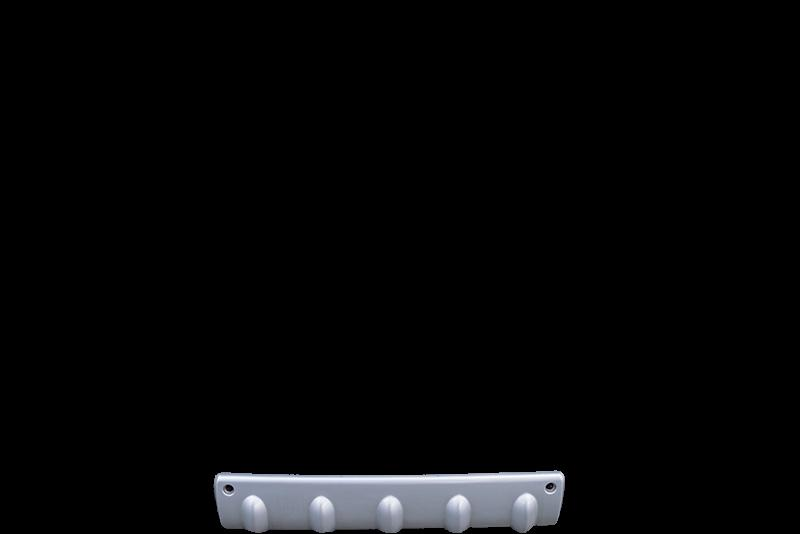
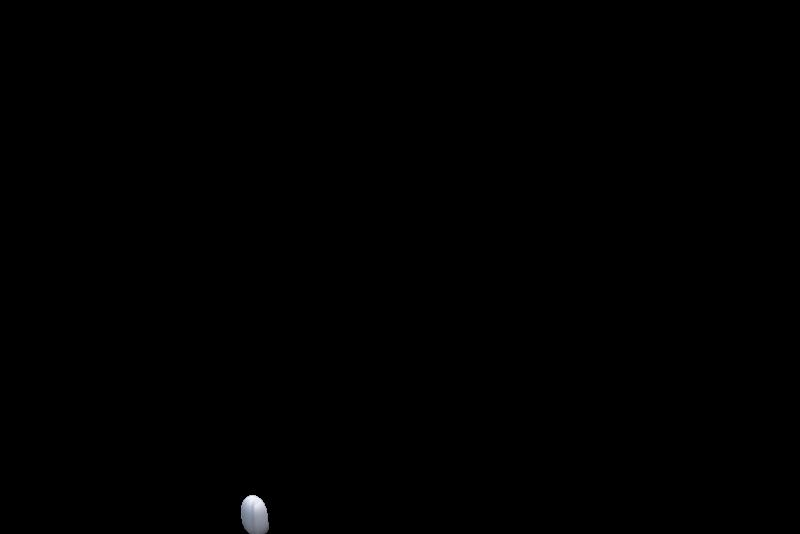
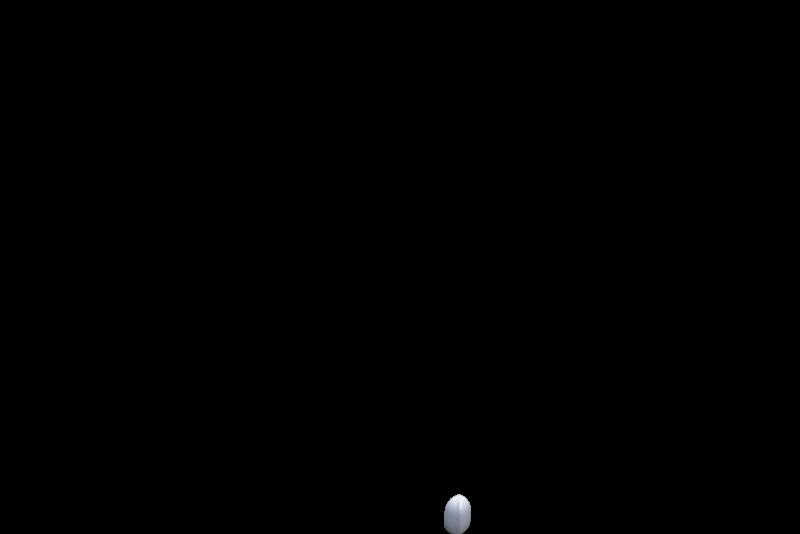
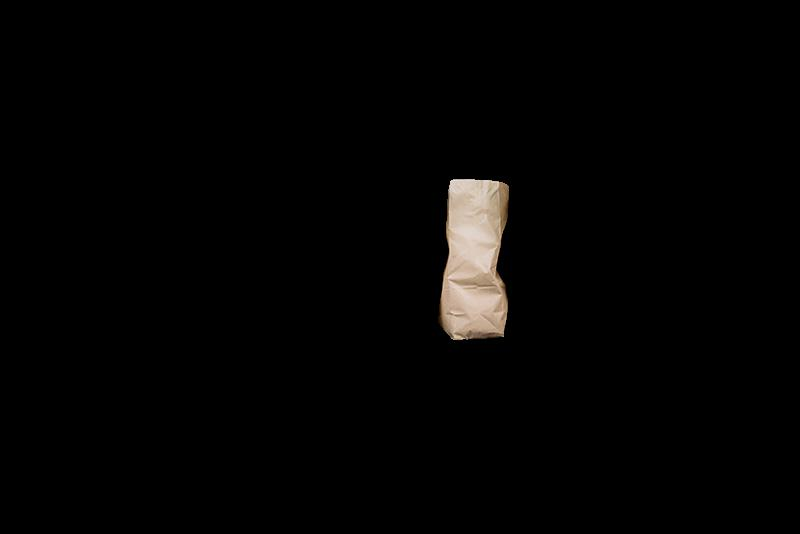
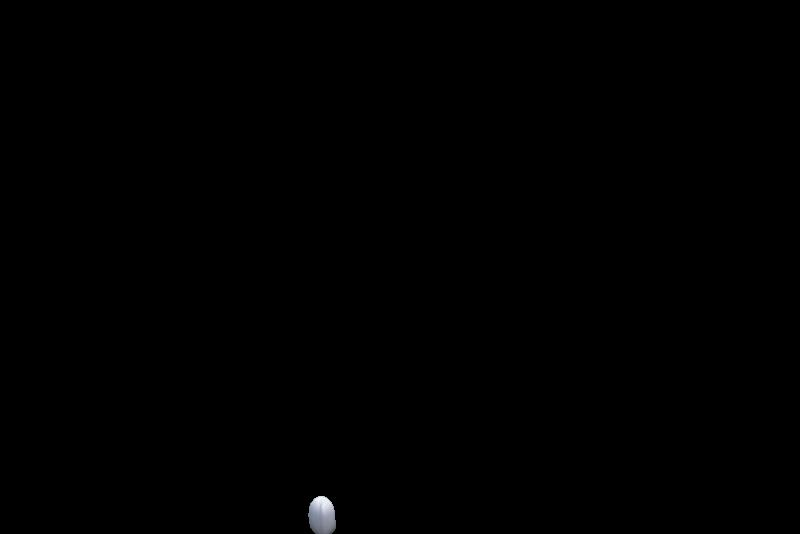
...
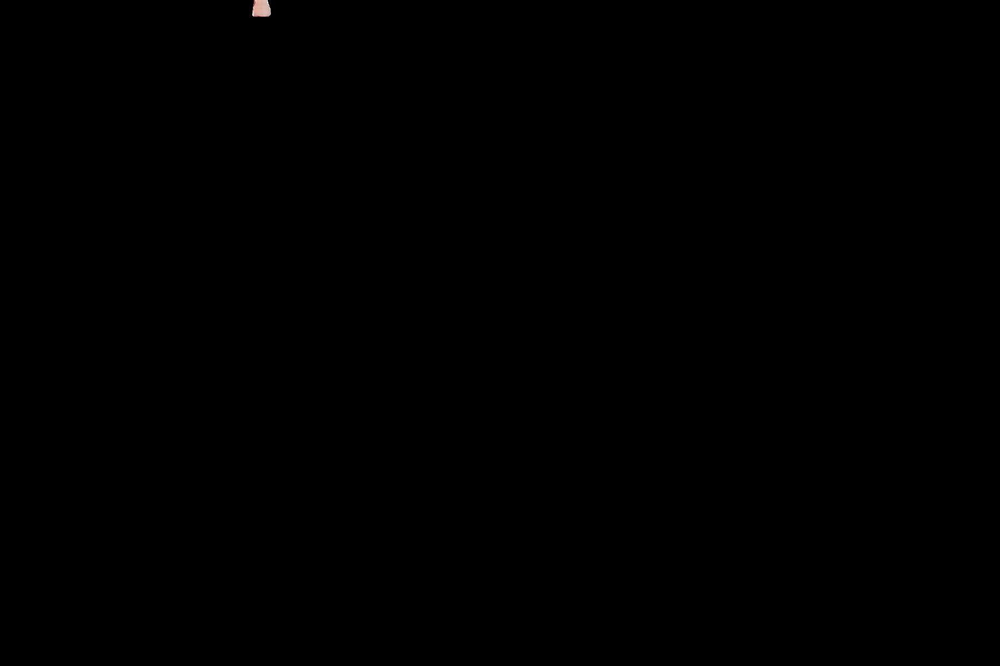
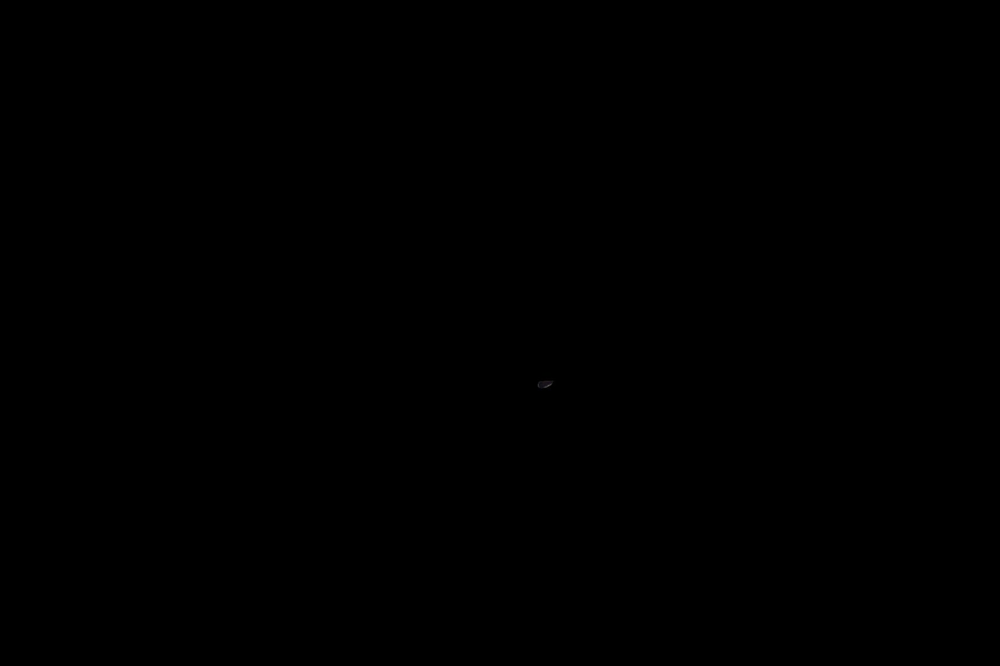
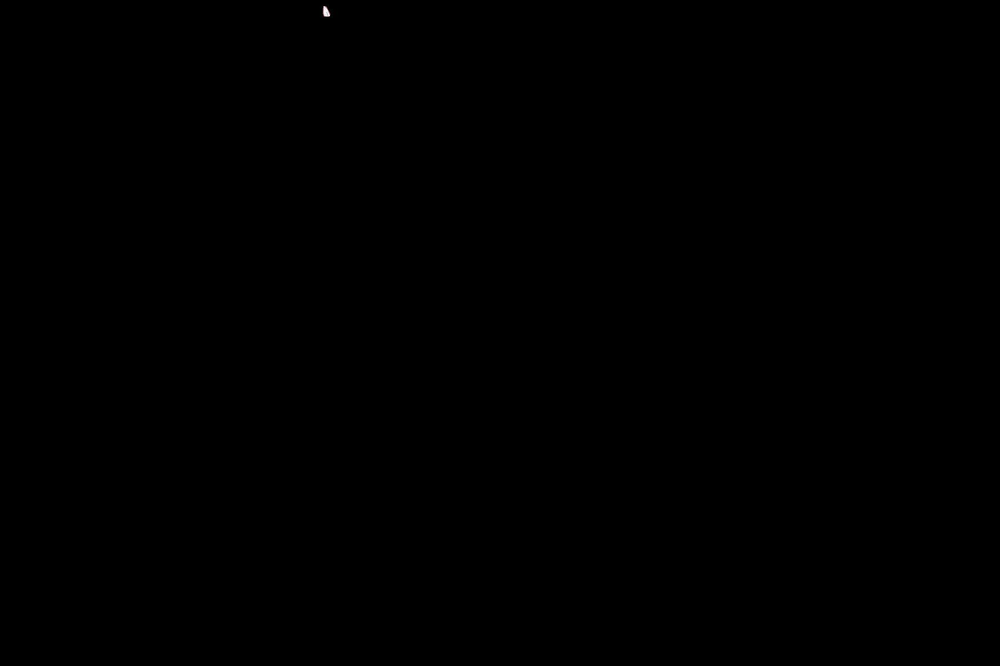
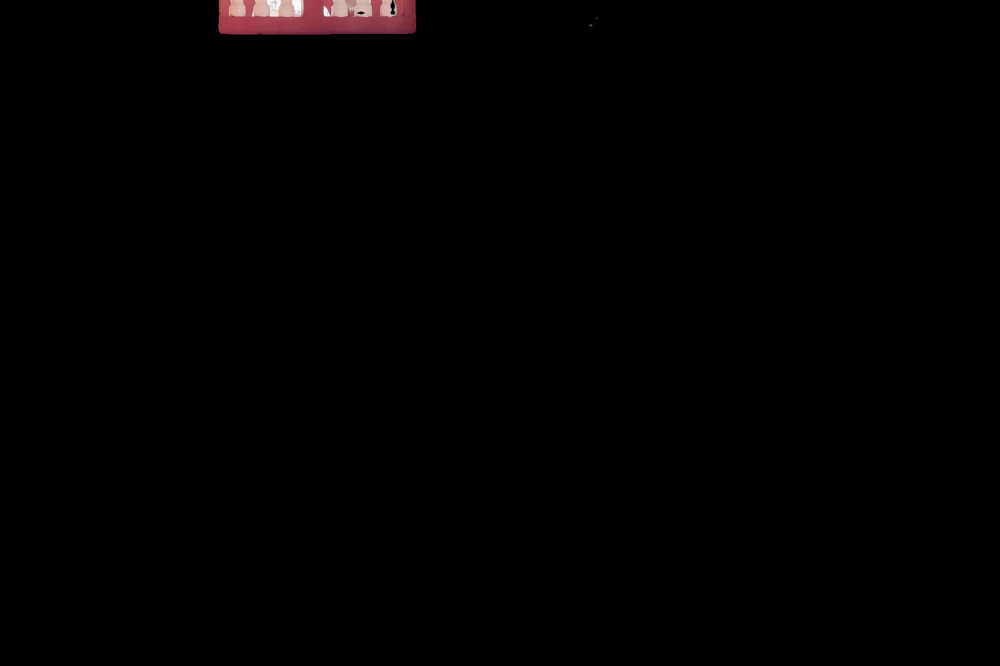
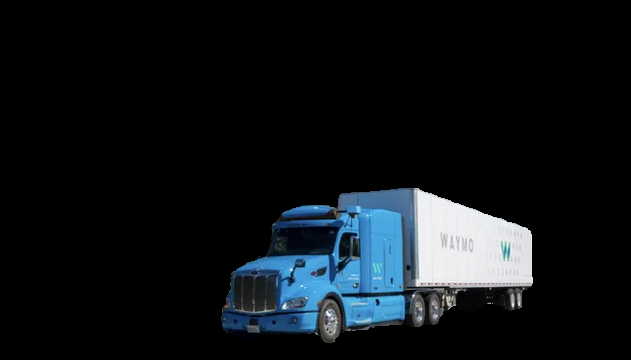